# Data Analysis and Visualization for Electric Vehicles

### Author: Aaron Thomas

## Description

<p>The purpose of this project is to explore the Electric Vehicle Population Data from Washington state to analyze trends in EV adoption, popular models, and geographic distribution.</p>
<p><b>Goals: </b>Analyze insights into EV adoption and distribution to support policy, infrastructure, and market analysis.</p>

## Table of Contents

<ol>
  <li>Introduction
    <ol style="list-style-type: none;">
      <li>1.1. Libraries</li>
      <li>1.2. Import Libraries</li>
    </ol>
  </li>
  <li>Data Collection & Description
    <ol style="list-style-type: none;">
      <li>2.1. Glossary of EV Dataset</li>
    </ol>
  </li>
  <li>Data Cleaning & Preprocessing</li>
  <li>Exploratory Data Analysis (EDA)
    <ol style="list-style-type: none;">
      <li>4.1. EV Adoption Trends Over Time</li>
      <li>4.2. Trends by EV Type</li>
      <li>4.3. County Level Distribution</li>
      <li>4.4. City Level Distribution</li>
      <li>4.5. EV Density for Counties (Choropleth Map)</li>
      <li>4.6. Vehicle Location (Heat Map)</li>
      <li>4.7. Top 10 EV Makes</li>
      <li>4.8. Top 10 EV Models</li>
      <li>4.9. CAFV Eligibility Analysis</li>
    </ol>
  </li>
  <li>Insights & Key Findings</li>
  <li>Conclusion</li>
  <li>References</li>
</ol>

### 1. Introduction

<p>In recent years, electric vehicle (EV) adoption has been on the rise, driven by environmental concerns, potential cost savings, and advancements in battery technology. This project analyzes the Electric Vehicle Population dataset from the Washington State Department of Licensing, which provides detailed information on EV ownership, including make and model, type, model year, geographic distribution, and electric range.</p>
<p>This project will use the dataset to answer some key questions such as:</p>


<ul>
    <li>Which counties and cities have the highest concentration of EVs?</li>
    <li>What makes and models are most popular among Washington EV owners?</li>
    <li>How has EV adoption evolved over time?</li>
    <li>How can we visualize the concentration of EVs using maps?</li>
</ul>

#### 1.1. Libraries

<p>The following libraries will be used:</p>
<ul>
    <li><b>Pandas:</b> Load, clean, and manipulate data.</li>
    <li><b>Numpy:</b> Perform numerical operations.</li>
    <li><b>Matplotlib:</b> Plotting data (bar charts, line plots, etc).</li>
    <li><b>Seaborn:</b> Plotting statistical data.</li>
    <li><b>Geopandas:</b> Work with geographical data.</li>
    <li><b>Folium:</b> Interactive maps.</li>
</ul>

<p>The dataset was obtained through the open data portal from data.gov. This can also be obtained through the Washington State Department of Licensing or data.gov.</p>

<p>Dataset Link: <a href="https://catalog.data.gov/dataset/electric-vehicle-population-data">https://catalog.data.gov/dataset/electric-vehicle-population-data</a></p>

#### 1.2. Import Libraries

In [2]:
%pip install plotly geopandas folium
%pip install pandas numpy matplotlib seaborn

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import folium
from folium.features import GeoJsonTooltip
from folium.plugins import HeatMap

### 2. Data Collection & Description

<p>To start, we will load the csv, show the number of rows and columns, and display the first 5 rows.</p>

In [4]:
df = pd.read_csv("Electric_Vehicle_Population_Data.csv") # Load the csv as a DataFrame
print(df.shape) # Displays the number of rows and columns
df.head() # Display the first 5 rows of the DataFrame

(250659, 17)


,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,5YJSA1E65N,Yakima,Granger,WA,98932.0,2022,TESLA,MODEL S,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,0.0,15.0,187279214,POINT (-120.1871 46.33949),PACIFICORP,5.307700e+10
1,KNDC3DLC5N,Yakima,Yakima,WA,98902.0,2022,KIA,EV6,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,0.0,15.0,210098241,POINT (-120.52041 46.59751),PACIFICORP,5.307700e+10
2,5YJYGDEEXL,Snohomish,Everett,WA,98208.0,2020,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,291.0,0.0,44.0,121781950,POINT (-122.18637 47.89251),PUGET SOUND ENERGY INC,5.306104e+10
3,3C3CFFGE1G,Yakima,Yakima,WA,98908.0,2016,FIAT,500,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84.0,0.0,14.0,180778377,POINT (-120.60199 46.59817),PACIFICORP,5.307700e+10
4,KNDCC3LD5K,Kitsap,Bremerton,WA,98312.0,2019,KIA,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26.0,0.0,26.0,2581225,POINT (-122.65223 47.57192),PUGET SOUND ENERGY INC,5.303508e+10


#### 2.1. Glossary of EV Dataset

<p>Here is a list of terms to get a better understanding of the dataset:</p>
<ul>
    <li><b>VIN (1-10):</b> First 10 characters of the Vehicle Identification Number.</li>
    <li><b>County:</b> County in Washington where the vehicle is registered.</li>
    <li><b>City:</b> City in Washington where the vehicle is registered.</li>
    <li><b>State:</b> State where the vehicle is registered (all WA in this dataset).</li>
    <li><b>Postal Code:</b> ZIP code of the registered vehicle owner.</li>
    <li><b>Model Year:</b> The year the EV was manufactured.</li>
    <li><b>Make:</b> Manufacturer of the EV (e.g., Tesla, Kia).</li>
    <li><b>Model:</b> Specific model of the vehicle (e.g., Model S, EV6).</li>
    <li><b>Electric Vehicle Type:</b> Classification such as Battery Electric Vehicle (BEV) or Plug-in Hybrid Electric Vehicle).</li>
    <li><b>CAFV Eligibility:</b> Indicates whether the vehicle qualifies for Washington's Clean Alternative Fuel Vehicle program.</li>
    <li><b>Electric Range:</b> The EPA-estimated range (in miles) the vehicle can travel on a full charge.</li>
    <li><b>Base MSRP:</b> Manufacturer’s Suggested Retail Price for the base model of the vehicle at the time of sale (if available).</li>
    <li><b>Legislative District:</b> Washington State legislative district where the vehicle is registered.</li>
    <li><b>DOL Vehicle ID:</b> Unique vehicle record identifier assigned by the Department of Licensing.</li>
    <li><b>Vehicle Location:</b> Geographic coordinates (latitude and longitude) representing the approximate location of the registered vehicle, typically based on ZIP code or city center. Used for mapping and spatial analysis.</li>
    <li><b>Electric Utility:</b> The primary electric service provider for the area where the vehicle is registered. This can be used to analyze EV adoption trends by utility service areas and to assess infrastructure needs for charging networks.</li>
     <li><b>2020 Census Tract:</b> The U.S. Census Bureau's geographic identifier for the area where the vehicle is registered, based on 2020 Census boundaries. A census tract is a small, relatively permanent statistical subdivision of a county, useful for detailed demographic and spatial analysis.</li>
</ul>

### 3. Data Cleaning & Preprocessing

<p>To check for any duplicate rows, we can use the following:</p>

In [5]:
duplicate = df.duplicated() # Checks for any duplicate rows
print(duplicate)

0         False
1         False
2         False
3         False
4         False
          ...  
250654    False
250655    False
250656    False
250657    False
250658    False
Length: 250659, dtype: bool


<p>To check for any missing data, we can use:</p>

In [6]:
df.isnull().sum()

VIN (1-10)                                             0
County                                                 6
City                                                   6
State                                                  0
Postal Code                                            6
Model Year                                             0
Make                                                   0
Model                                                  0
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                        21
Base MSRP                                             21
Legislative District                                 583
DOL Vehicle ID                                         0
Vehicle Location                                      14
Electric Utility                                       6
2020 Census Tract                                      6
dtype: int64

<p>Since there are missing values, we will remove all the rows with missing values. To do this we use:</p>

In [7]:
df = df.dropna()

In [8]:
df.shape

(250047, 17)

<p>Now that we have removed the rows with missing values, we can start analyzing the data.</p>

### 4. Exploratory Data Analysis (EDA)

#### 4.1. EV Adoption Trends Over Time

<p>Let's start by taking a look at the number of EVs by Model Year. We will use a bar chart.</p>

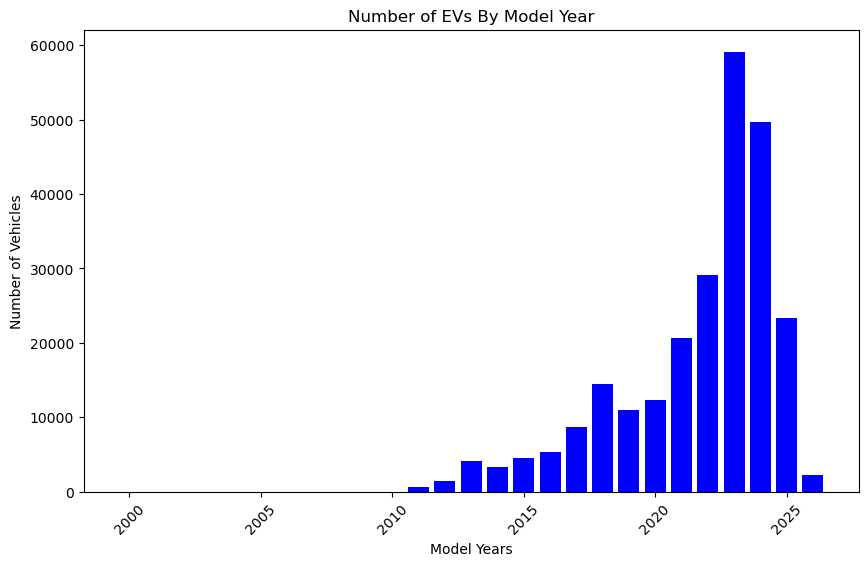

In [10]:
year_counts = df['Model Year'].value_counts().sort_index() # Data for the y-axis
plt.figure(figsize=(10,6))
plt.bar(year_counts.index, year_counts.values, color = 'blue') # Create bar graph
plt.xlabel('Model Years') # x-axis label
plt.xticks(rotation=45)
plt.ylabel('Number of Vehicles') # y-axis label
plt.title('Number of EVs By Model Year') # Title label
plt.show() # Display the plot

<p>Based on the data, it seems that a majority of EVs in Washington were made in 2023.</p>

#### 4.2. Trends by EV Type

<p>Let's also take a look at the number of EVs by EV types (BEV vs PHEV):</p>

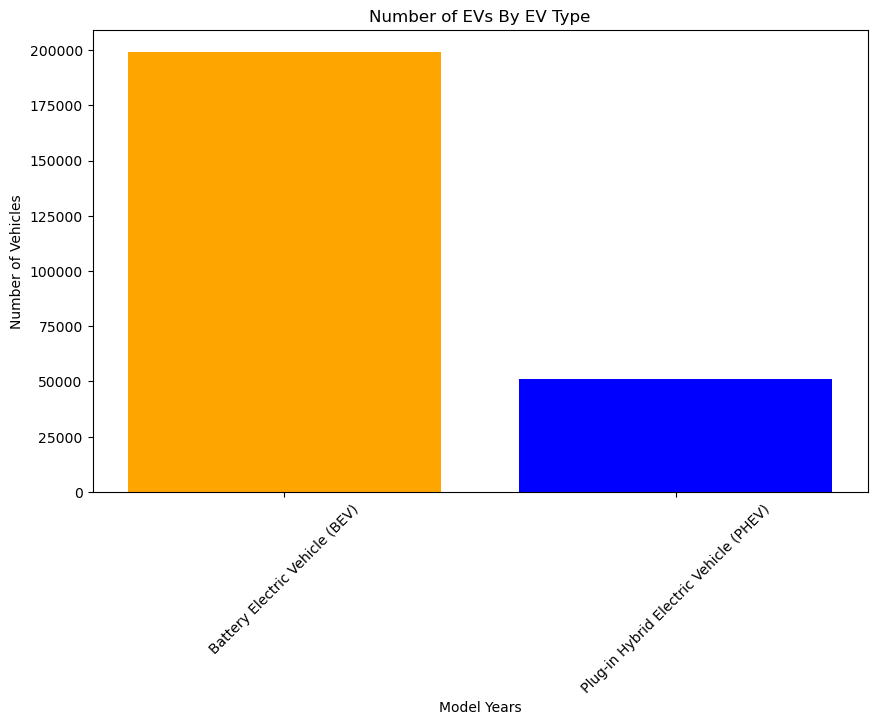

In [11]:
type_counts = df['Electric Vehicle Type'].value_counts().sort_index()
colors = ['orange', 'blue']
plt.figure(figsize=(10,6))
plt.bar(type_counts.index, type_counts.values, color=colors)
plt.xlabel('Model Years') # x-axis label
plt.xticks(rotation=45)
plt.ylabel('Number of Vehicles') # y-axis label
plt.title('Number of EVs By EV Type') # Title label
plt.show() # Display the plot

<p>Based on the data, the most popular EV types in Washington are Battery Electric Vehicles (BEV).</p>

#### 4.3. County Level Distribution

<p>Let's take a look at the distribution among the counties:</p>

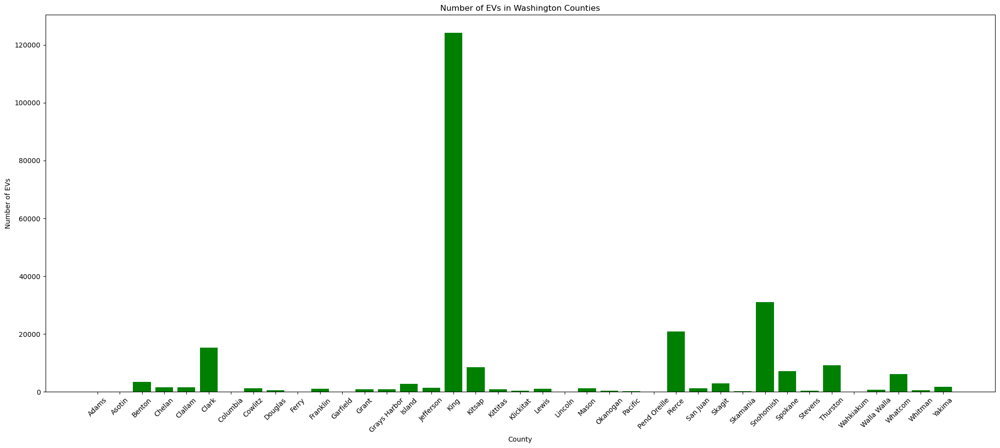

In [12]:
county_counts = df['County'].value_counts().sort_index()
plt.figure(figsize=(25,10))
plt.bar(county_counts.index, county_counts.values, color='green')
plt.xlabel('County')
plt.ylabel('Number of EVs')
plt.title('Number of EVs in Washington Counties')
plt.xticks(rotation=45)
plt.show()


<p>As it can be seen, King County has the most EVs. </p>

#### 4.4. City Level Distribution

<p>Let's also look at the distribution among cities:</p>

<p><b>Note: </b>Since there would be large amounts of data for cities, we will take a look at the top 10 cities.</p>

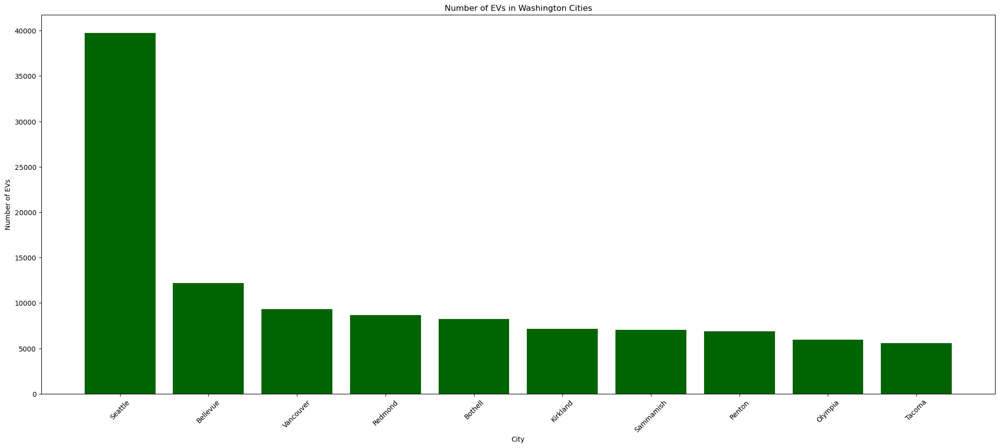

In [13]:
city_counts = df['City'].value_counts().head(10) # Counts the top 10 cities
plt.figure(figsize=(25,10))
plt.bar(city_counts.index, city_counts.values, color='darkgreen')
plt.xlabel('City')
plt.ylabel('Number of EVs')
plt.title('Number of EVs in Washington Cities')
plt.xticks(rotation=45)
plt.show()

<p>Based on the data, the city of Seattle has the most EVs, followed by Bellevue.</p>

#### 4.5. EV Density for Counties (Choropleth Map)

<p>Let's analyze the density of EVs for each county using a choropleth map:</p>

In [14]:
# Load the geojson file
gdf = gpd.read_file('WA_County_Boundaries.geojson')

#Drop the 'EDIT_DATE' column. This is so we don't get a Timestamp error
gdf = gdf.drop(columns=['EDIT_DATE'])
#Print the first 5 rows of the geojson file
print(gdf.head())

   OBJECTID  JURISDICT_SYST_ID  JURISDICT_TYPE_CD JURISDICT_LABEL_NM  \
0   1527450                 25                  4              Grant   
1   1531601                 33                  4           Garfield   
2   1531963                  8                  4             Island   
3   1532624                 35                  4        Walla Walla   
4   1532643                 34                  4           Columbia   

         JURISDICT_NM  JURISDICT_DESG_CD  JURISDICT_FIPS_DESG_CD  \
0        Grant County                 13                   53025   
1     Garfield County                 12                   53023   
2       Island County                 15                   53029   
3  Walla Walla County                 36                   53071   
4     Columbia County                  7                   53013   

  JURISDICT_VACATED_FLG  EDIT_STATUS EDIT_WHO  \
0                  None            1  TSTE490   
1                  None            1  TSTE490   
2          

In [15]:
#Group the EV data by county and count the number of EVs
ev_counts = df.groupby('County').size().reset_index(name='EV Count')
# Take the county column in ev_counts and changes text to title case, and remove trailing whitespace
ev_counts['County'] = ev_counts['County'].str.title().str.strip()

# Take the county column in geojson and changes text to title case, and remove trailing whitespace
gdf['JURISDICT_LABEL_NM'] = gdf['JURISDICT_LABEL_NM'].str.title().str.strip()

# Merge EV data with County boundaries
merged = gdf.merge(ev_counts, left_on='JURISDICT_LABEL_NM', right_on='County', how='left')
merged['EV Count'] = merged['EV Count'].fillna(0) # Fill missing values with 0
#Create the map centered on Washington state
m = folium.Map(location=[47.5, -120.5], zoom_start=7)

# Create the Choropleth map
folium.Choropleth(
    geo_data=merged, # Geographic data: Merged GeoDataFrame (boundaries and EV counts)
    data=merged, # data for coloring
    columns=['JURISDICT_LABEL_NM', 'EV Count'], # for coloring
    key_on='feature.properties.JURISDICT_LABEL_NM', # Matches GeoJSON property to data key
    fill_color='YlGnBu', # Color for counties based on population
    fill_opacity=0.7, # Transparency colors
    line_opacity=0.2, # Boundary lines
    legend_name='Number of EVs' # Label for legend
).add_to(m)

# Tooltip layer
folium.GeoJson(
    merged,
    name="EV Data",
    style_function=lambda x: {
        'color': 'transparent', # Remove the blue border line
        'fillOpacity': 0, # Removes the blue color overshadowing the YlGnBu
    },
    tooltip=GeoJsonTooltip( # Shows the county name and EV count when hovering over counties
        fields=['JURISDICT_LABEL_NM', 'EV Count'], # Display label for tooltips
        aliases=['County:', 'EV Count:'], # Display labels for tooltips
        localize=True # Formats the numbers
    )
).add_to(m)
    

m # Display map

<p>As you can see, the choropleth map shows King County as the county with most EVs in blue, followed by Snohomish and Pierce counties in green. Counties with less than 20,000 are in yellow.</p>

#### 4.6. Vehicle Location (Heat Map)

<p>We can also use a heat map to see where the EVs are located based on latitude/longitude.</p>

<p>Before we can create the heat map, we will need to extract the longitude and latitude from WKT POINT Format. To do this:</p>

In [16]:
df[['Longitude', 'Latitude']] = (df['Vehicle Location'].str.replace('POINT \(|\)', '', regex=True).str.split(' ', expand=True).astype(float))
# Following line removes the 'POINT (' ')' and splits into two columns, and then converts from string to float

<p>To create the heat map:</p>

In [17]:
#Create the map centered on Washington state
m = folium.Map(location=[47.5, -120.5], zoom_start=7)

heat_data = df[['Latitude', 'Longitude']].dropna().values.tolist()
HeatMap(heat_data, radius=8).add_to(m)

m

<p>Based on the heat map, most of the EVs are heavily populated in the Seattle area.</p>

#### 4.7. Top 10 EV Makes

<p>To determine the top 10 EV brand makes, we can use a bar chart. To do this:</p>

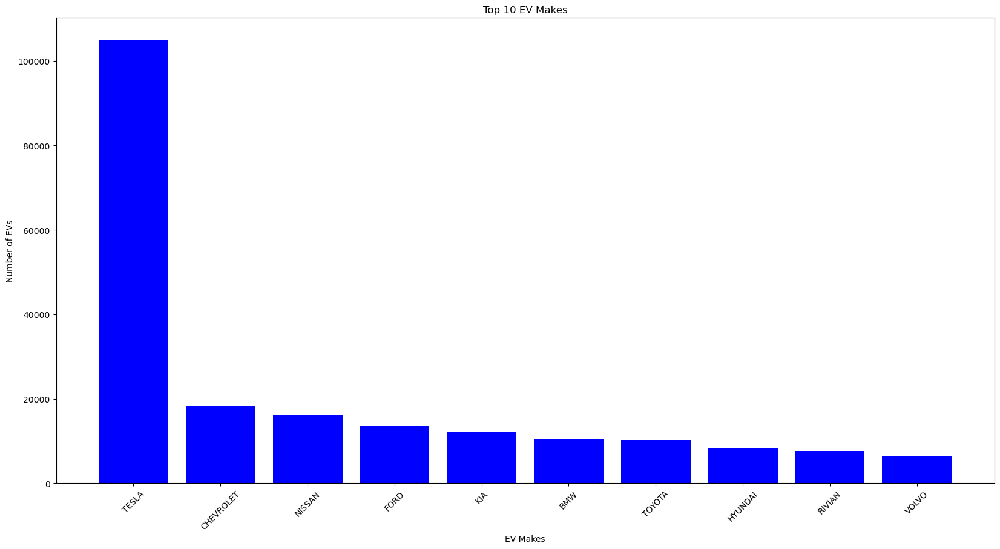

In [18]:
make_counts = df['Make'].value_counts().head(10) # Counts the top 10 makes
plt.figure(figsize=(20,10))
plt.bar(make_counts.index, make_counts.values, color = 'blue')
plt.xlabel('EV Makes')
plt.ylabel('Number of EVs')
plt.title('Top 10 EV Makes')
plt.xticks(rotation=45)
plt.show()

<p>Based on the data, we can see that Tesla is the most popular EV make in Washington. A key factor is due to Tesla being a popular EV make around the world.</p>

#### 4.8. Top 10 EV Models

<p>Let's also determine the top 10 EV models in Washington, to do this:</p>

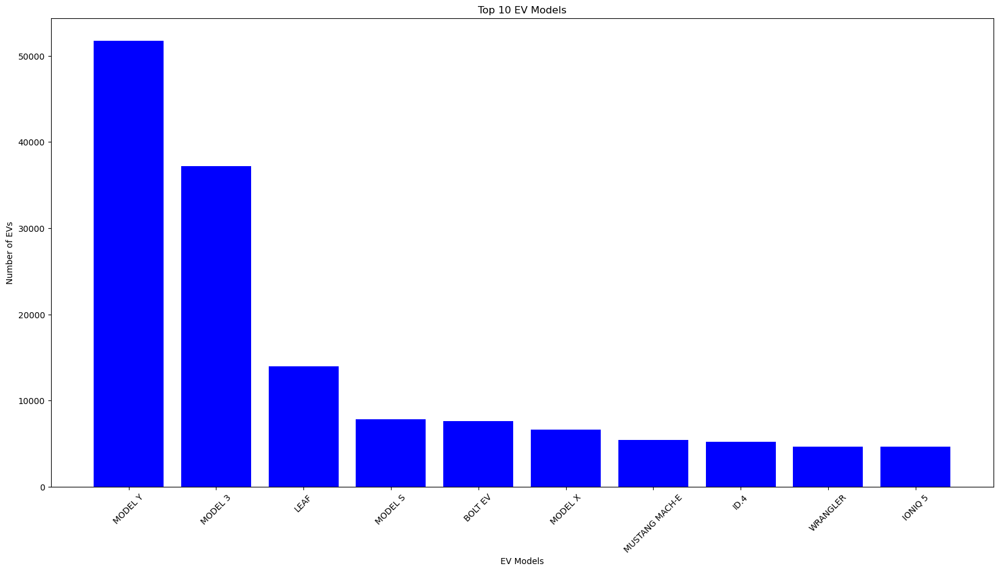

In [19]:
model_counts = df['Model'].value_counts().head(10) # Counts the top 10 makes
plt.figure(figsize=(20,10))
plt.bar(model_counts.index, model_counts.values, color = 'blue')
plt.xlabel('EV Models')
plt.ylabel('Number of EVs')
plt.title('Top 10 EV Models')
plt.xticks(rotation=45)
plt.show()

<p>It can be seen that from the top 10 EV models, most of the models are from Tesla, with the Model Y being the most popular.</p>

#### 4.9. CAFV Eligibility Analysis

<p>Let's look at number of eligible vs ineligible EVs for CAFVs:</p>

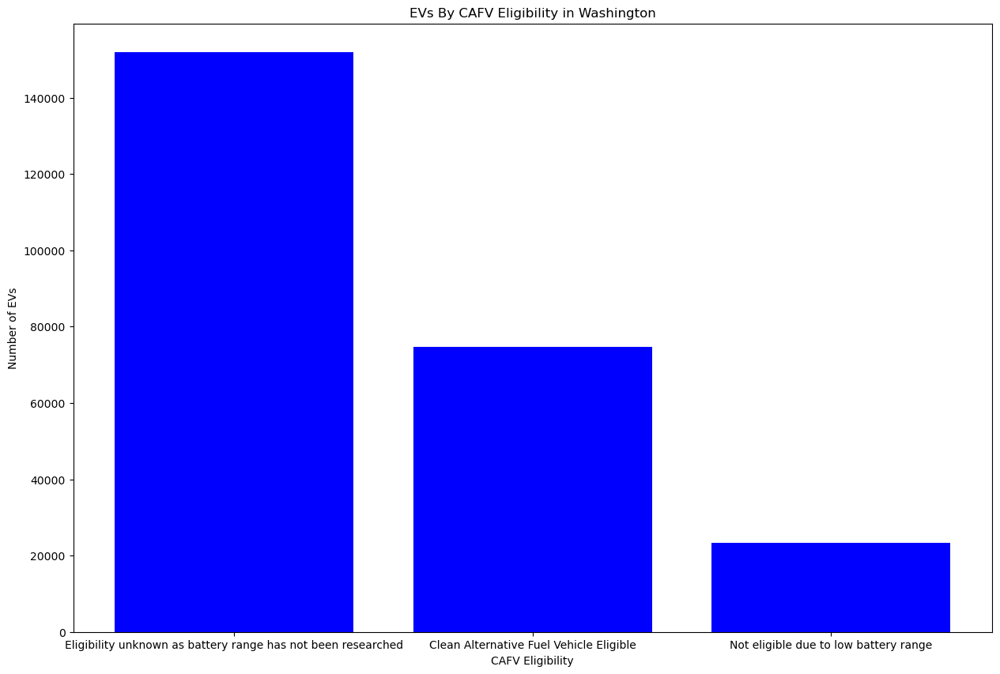

In [20]:
cafv_counts = df['Clean Alternative Fuel Vehicle (CAFV) Eligibility'].value_counts()
plt.figure(figsize=(15,10))
plt.bar(cafv_counts.index, cafv_counts.values, color = 'blue')
plt.xlabel('CAFV Eligibility')
plt.ylabel('Number of EVs')
plt.title('EVs By CAFV Eligibility in Washington')
plt.xticks()
plt.show()

<p>As it can be seen, the eligibility for EVs is unknown. This could be due to many factors, including:</p>
<ul>
    <li>Newer models entering the market</li>
    <li>Not enough data for vehicles yet.</li>
</ul>
<p>To get a better understanding, we can use a seaborn barplot to group the model years and CAFV eligibility:</p>

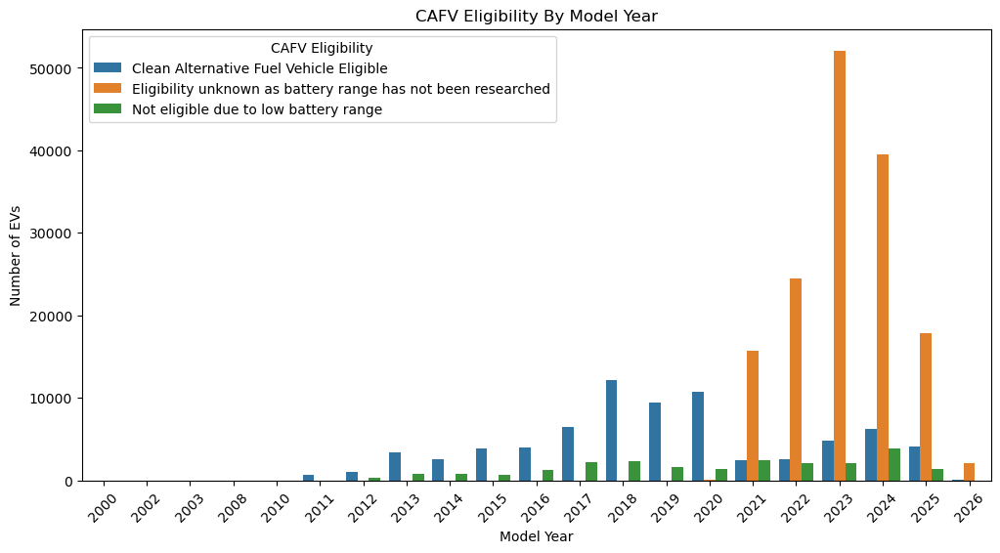

In [22]:
# Group by model year and CAFV eligibility
group_data = df.groupby(['Model Year', 'Clean Alternative Fuel Vehicle (CAFV) Eligibility']).size().reset_index(name='Count')

plt.figure(figsize=(12,6)) # Set the size of the bar plot
sns.barplot( # Use a barplot using seaborn to help with group data
    x = 'Model Year', # X-axis data
    y='Count', # Y-axis data
    hue= 'Clean Alternative Fuel Vehicle (CAFV) Eligibility', # Parameters to break colors by
    data= group_data # Data for the plot
)
plt.xlabel('Model Year') # Label for x-axis
plt.ylabel('Number of EVs') # Label for y-axis
plt.title('CAFV Eligibility By Model Year') # Title of plot
plt.xticks(rotation=45) # Rotates the x-ticks by 45 degrees
plt.legend(title='CAFV Eligibility') # Legend for CAFV Eligibility
plt.show() # Display bar plot

<p>As it can be seen, the newer models from 2020 to today mostly have unknown eligibility, with 2023 being the highest. As mentioned earlier, this is because they are new to the market, meaning there would need to be more data as the years go by.</p>

### 5. Insights and Key Findings

<p>Based on the patterns, it was seen that:</p>
<ul>
    <li>EVs made in 2023 were the most popular in Washington.</li>
    <li>The majority of EVs in Washington are battery-powered.</li>
    <li>The county with the most EVs is King County.</li>
    <li>Seattle is the city with the most EVs.</li>
    <li>The choropleth map is able to show us a visualization of which county has the most and least EVs.</li>
    <li>The heat map is able to show us the areas where EVs are populated.</li>
    <li>Tesla is the most popular EV make in Washington, with the Model Y also being the most popular model.</li>
    <li>The CAFV Eligibility for most EVs is currently unknown, with factors including the models being newer and the need for more data as the years pass.</li>
</ul>

### 6. Conclusion

<p>In conclusion, the State of Washington's Electric Vehicle Population dataset provided valuable insights into EV adoption trends, leading models, and geographic distribution. The analysis revealed a strong concentration of newer vehicles, with 2023 models dominating registrations, and Tesla's Model Y emerging as the most prevalent. King County and Seattle were identified as the primary hubs for EV ownership, supported by choropleth and heat map visualizations. Furthermore, the majority of vehicles currently hold an "Eligibility Unknown" status for the CAFV program, largely due to the recency of many models and incomplete range data. These results highlight Washington's rapid EV growth while highlighting areas where data gaps remain.</p>
<p>Looking ahead, further research could explore the relationship between EV adoption and factors such as charging infrastructure availability, demographic patterns, and local incentives. Additionally, improving data collection and reporting—particularly for CAFV eligibility—would support more informed policy decisions and targeted infrastructure investments to sustain Washington's rapid EV growth.</p>

### 7. References

<p>Here are some references that were used:</p>

<ul>
    <li><a href="https://geopandas.org/en/stable/gallery/plotting_with_folium.html">Plotting with Folium | GeoPandas</a></li>
    <li><a href="https://geopandas.org/en/stable/docs/user_guide/io.html">Reading and Writing Files | GeoPandas</a></li>
    <li><a href="https://pandas.pydata.org/docs/user_guide/missing_data.html">Working with Missing Data | Pandas</a></li>
</ul>